<a href="https://colab.research.google.com/github/gabrielbchacon/visual_computing_notebooks/blob/main/FaceDetection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

#Importing Libs

In [10]:
import cv2 #import opencv
from google.colab.patches import cv2_imshow


from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


#Getting the test image

In [4]:
#How to export to a variable
imagem = cv2.imread('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/people1.jpg')

In [6]:
#Getting the image size
imagem.shape

(1280, 1920, 3)

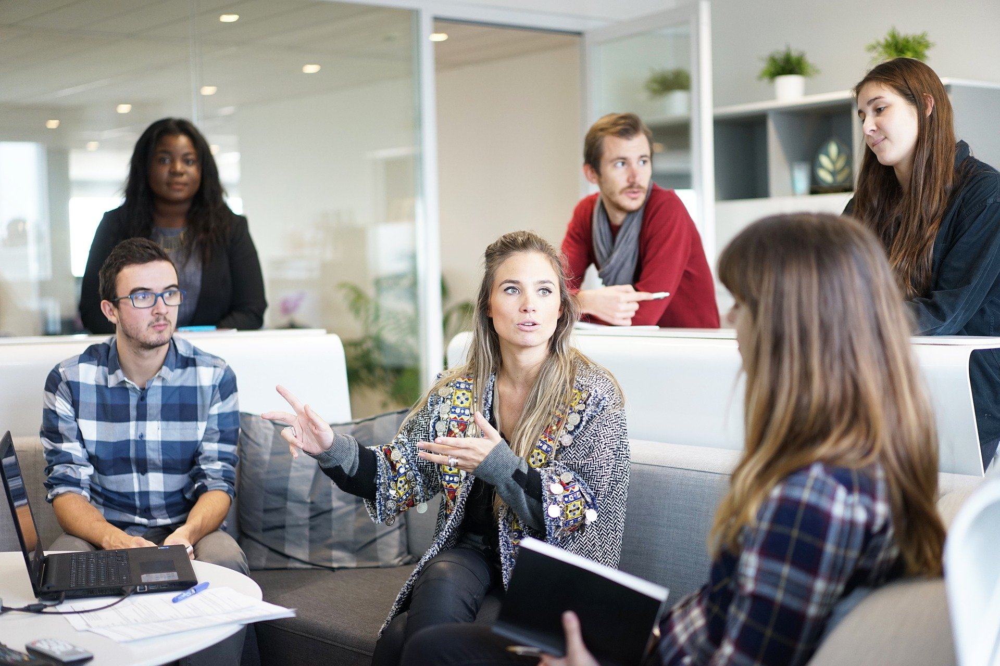

In [11]:
#Show method
cv2_imshow(imagem)

In [13]:
#to reduce the processing requested, we need to resize first
imagem = cv2.resize(imagem, (800, 600))
imagem.shape

(600, 800, 3)

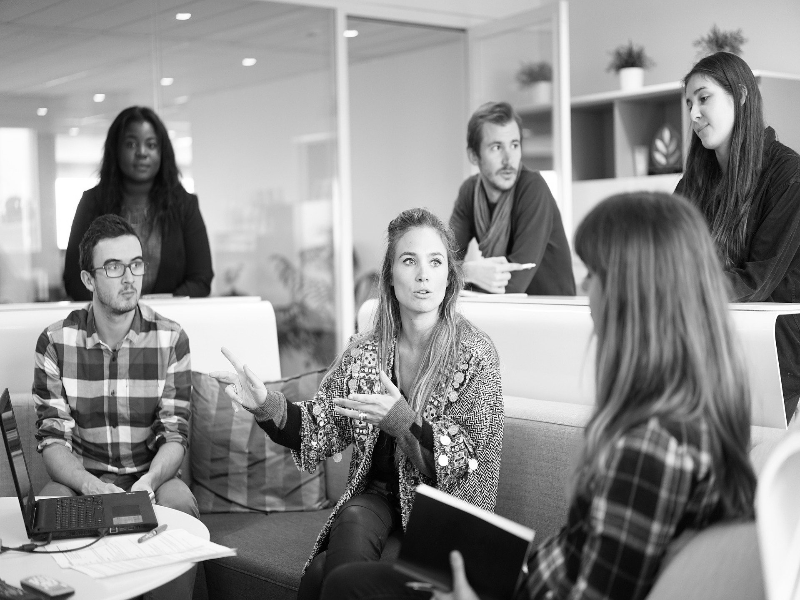

In [14]:
# how to convert this img to gray scale

img_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)
cv2_imshow(img_gray)

#Face Detection

In [15]:
#Instancing the classifier
facial_dect = cv2.CascadeClassifier('/content/drive/MyDrive/Visão Computacional Guia Completo/Cascades/haarcascade_frontalface_default.xml')

In [16]:
#aplying to the img_gray
detections = facial_dect.detectMultiScale(img_gray)

In [17]:
#As a response, the classifier return an array with all the areas with faces
#[x, y, weigh, heigh]
detections

array([[677,  72,  68,  68],
       [115, 124,  53,  53],
       [475, 123,  59,  59],
       [387, 233,  73,  73],
       [ 92, 239,  66,  66],
       [390, 323,  56,  56]], dtype=int32)

In [18]:
#We can use len to get how much faces the classifier got
len(detections)

6

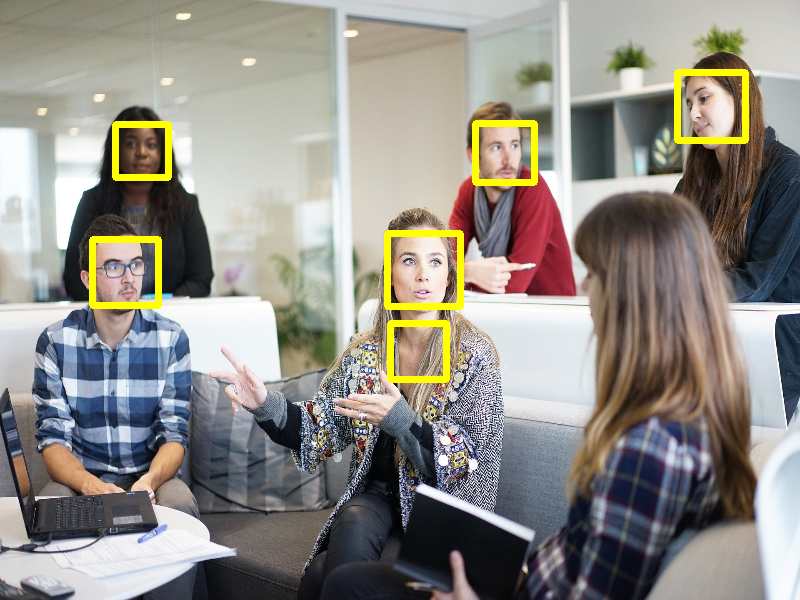

In [22]:
#Showing the results in the original image
for x, y, w, h in detections:
  #color following the BGR scale
  cv2.rectangle(imagem, (x,y), (x + w, y+ h), (0,255,255), 5)
cv2_imshow(imagem)

#Haarcascades Parameters

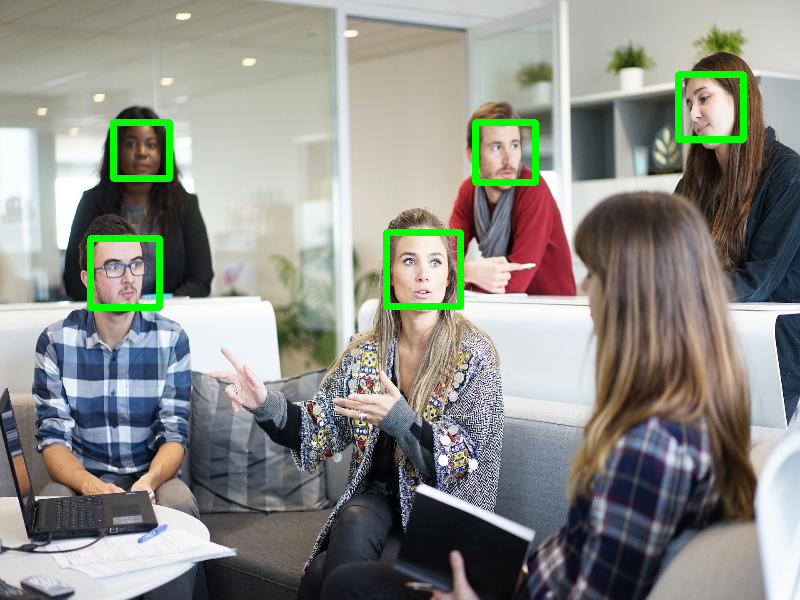

In [44]:
imagem = cv2.imread('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/people1.jpg')
imagem = cv2.resize(imagem, (800, 600))

img_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

#Changing the scalefactor
#minimun value > 1 . First try values greater than 1. Then if it was needed, try values between 1 and 1.1
detections = facial_dect.detectMultiScale(img_gray, scaleFactor=1.09)

#Showing the results in the original image
for x, y, w, h in detections:
  #color following the BGR scale
  cv2.rectangle(imagem, (x,y), (x + w, y+ h), (0,255,0), 5)
cv2_imshow(imagem)

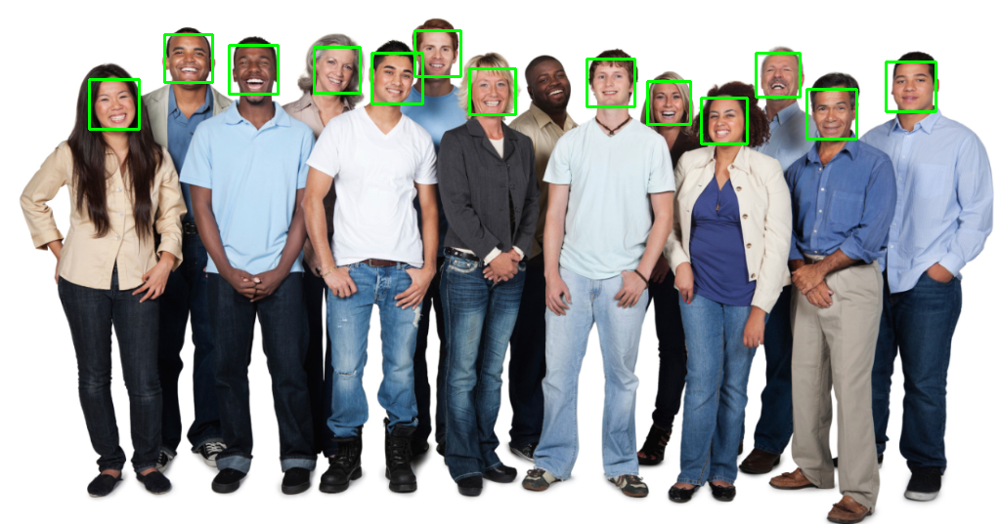

In [45]:
imagem = cv2.imread('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/people2.jpg')
img_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

detections = facial_dect.detectMultiScale(img_gray, scaleFactor=1.2, minNeighbors=3,
                                          minSize=(32,32), maxSize=(100,100))

for x, y, w, h in detections:
  cv2.rectangle(imagem, (x,y), (x + w, y+ h), (0,255,0), 2)
cv2_imshow(imagem)

#Eyes Detection

In [49]:
eyes_dect = cv2.CascadeClassifier('/content/drive/MyDrive/Visão Computacional Guia Completo/Cascades/haarcascade_eye.xml')

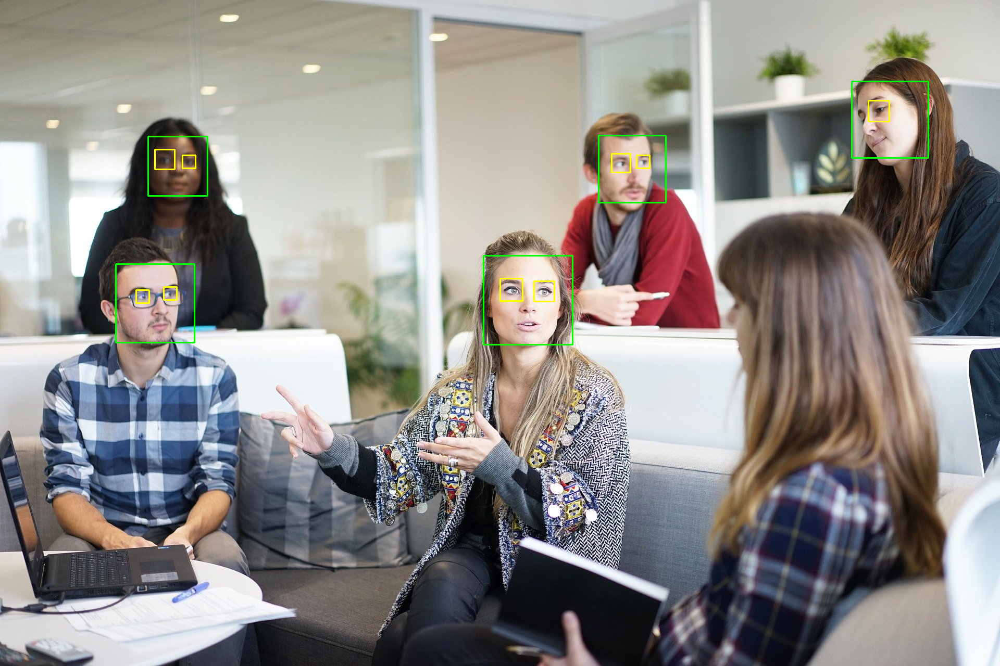

In [60]:
imagem = cv2.imread('/content/drive/MyDrive/Visão Computacional Guia Completo/Images/people1.jpg')
#imagem = cv2.resize(imagem, (800, 600))

img_gray = cv2.cvtColor(imagem, cv2.COLOR_BGR2GRAY)

detections_facial = facial_dect.detectMultiScale(img_gray, scaleFactor=1.3, minSize=(30,30))

detections_eye = eyes_dect.detectMultiScale(img_gray, scaleFactor=1.09, minNeighbors=10, maxSize=(70, 70))

for x, y, w, h in detections_facial:
  cv2.rectangle(imagem, (x,y), (x + w, y+ h), (0,255,0), 2)

for x, y, w, h in detections_eye:
  cv2.rectangle(imagem, (x,y), (x + w, y+ h), (0,255,255), 2)


cv2_imshow(imagem)

